# Analyse de corrélation

Nos données contiennent de nombreuses valeurs NaN. Supprimer les colonnes fortement corrélées améliore la rapidité et la robustesse du modèle tout en réduisant le surapprentissage.

## Objectif
Réduire le nombre de colonnes en tenant compte à la fois du nombre de valeurs manquantes et de la corrélation entre colonnes.

## Méthode proposée

1. Regrouper les colonnes par nombre de valeurs manquantes  
    - Exemple : si v1 et v3 ont 56 NaN, v2 en a 21 et v4 en a 5 → groupes : `['v1','v3']`, `['v2']`, `['v4']`.

2. Pour chaque groupe :  
    2.1 Calculer la matrice de corrélation entre les colonnes du groupe.  
         - Ne retenir que les paires dont le coefficient de corrélation (absolu) est ≥ 0,75 (seuil ajustable).

    2.2 Construire des sous-groupes en fusionnant les ensembles de colonnes corrélées (union des ensembles qui se recoupent).  
         - Exemple : `[[v1,v2], [v6], [v1,v4,v2,v5], [v5,v4]]` → fusionner les recouvrements → `[[v1,v2,v4,v5], [v6]]`.

    2.3 Dans chaque sous-groupe, conserver la colonne la plus informative : celle qui a le plus grand nombre de valeurs uniques.  
         - Exemple pour `[v1,v2,v4,v5]` : si `v2` a le plus d’unicité, garder `v2`. Résultat final : `[v2, v6]`.


In [293]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx  # Librairie utile pour gérer les graphes
import gc

In [294]:
df_train = pd.read_csv("../Data/train_combined.csv")

In [296]:
df_missing = top_missing_cols(df=df_train,n=None,thresh=50)
missing_cols = df_missing['col']

Il y a 414 colonnes dans ce jeu de données contenant des valeurs manquantes.
Il y a 214 colonnes dont le pourcentage de valeurs manquantes est supérieur à 50%.


In [297]:
# nous allons prendre toutes les colonnes et les regrouper en fonction du pourcentage manquant
nan_dict = {}
for col in missing_cols:
    count = df_train[col].isnull().sum()
    try:
        nan_dict[count].append(col)
    except:
        nan_dict[count] = [col]
        
for k,v in nan_dict.items():
    print(f'#####' * 4)
    print(f'Nombre de NAN = {k} pourcentage: {(int(k)/df_train.shape[0])*100} %')
    print(v)

####################
Nombre de NAN = 585793 pourcentage: 99.19615944728554 %
['id_24']
####################
Nombre de NAN = 585408 pourcentage: 99.13096487960172 %
['id_25']
####################
Nombre de NAN = 585385 pourcentage: 99.12707013919464 %
['id_07', 'id_08']
####################
Nombre de NAN = 585381 pourcentage: 99.12639279303687 %
['id_21']
####################
Nombre de NAN = 585377 pourcentage: 99.12571544687913 %
['id_26']
####################
Nombre de NAN = 585371 pourcentage: 99.1246994276425 %
['id_22', 'id_27', 'id_23']
####################
Nombre de NAN = 552913 pourcentage: 93.62837403054831 %
['dist2']
####################
Nombre de NAN = 551623 pourcentage: 93.40992989467267 %
['D7']
####################
Nombre de NAN = 545427 pourcentage: 92.36072069631184 %
['id_18']
####################
Nombre de NAN = 528588 pourcentage: 89.50926270870728 %
['D13']
####################
Nombre de NAN = 528353 pourcentage: 89.46946862193924 %
['D14']
####################
Nom

In [299]:
def reduce_groups(df, grps):
    '''
    déterminer la colonne qui a le plus de valeurs uniques parmi un groupe d'attributs
    '''
    use = []
    for col in grps:
        max_unique = 0
        max_index = 0
        for i,c in enumerate(col):
            n = df[c].nunique()
            if n > max_unique:
                max_unique = n
                max_index = i
        use.append(col[max_index])
    return use

## Analyse de corrélation sur les colonnes V

## Groupe1 [V1 à V11]

In [300]:
def group_correlated_columns(df, cols, threshold=0.75):
    """
    Regroupe les colonnes corrélées entre elles selon un seuil donné (en gérant les chevauchements).
    """
    df_sub = df[cols]
    corr_matrix = df_sub.corr().abs()  # Valeurs absolues (corrélation + ou -)
    
    # Crée un graphe vide
    G = nx.Graph()
    
    # Ajoute les colonnes comme noeuds
    G.add_nodes_from(corr_matrix.columns)
    
    # Ajoute une arête entre deux colonnes si leur corrélation dépasse le seuil
    for i in corr_matrix.columns:
        for j in corr_matrix.columns:
            if i != j and corr_matrix.loc[i, j] >= threshold:
                G.add_edge(i, j)
    
    # Chaque composante connexe du graphe = un groupe de colonnes corrélées
    groups = [list(comp) for comp in nx.connected_components(G)]
    
    # On trie chaque sous-liste pour la lisibilité
    groups = [sorted(g) for g in groups]
    return sorted(groups, key=lambda x: x[0])


In [301]:
reduced_vcols = []

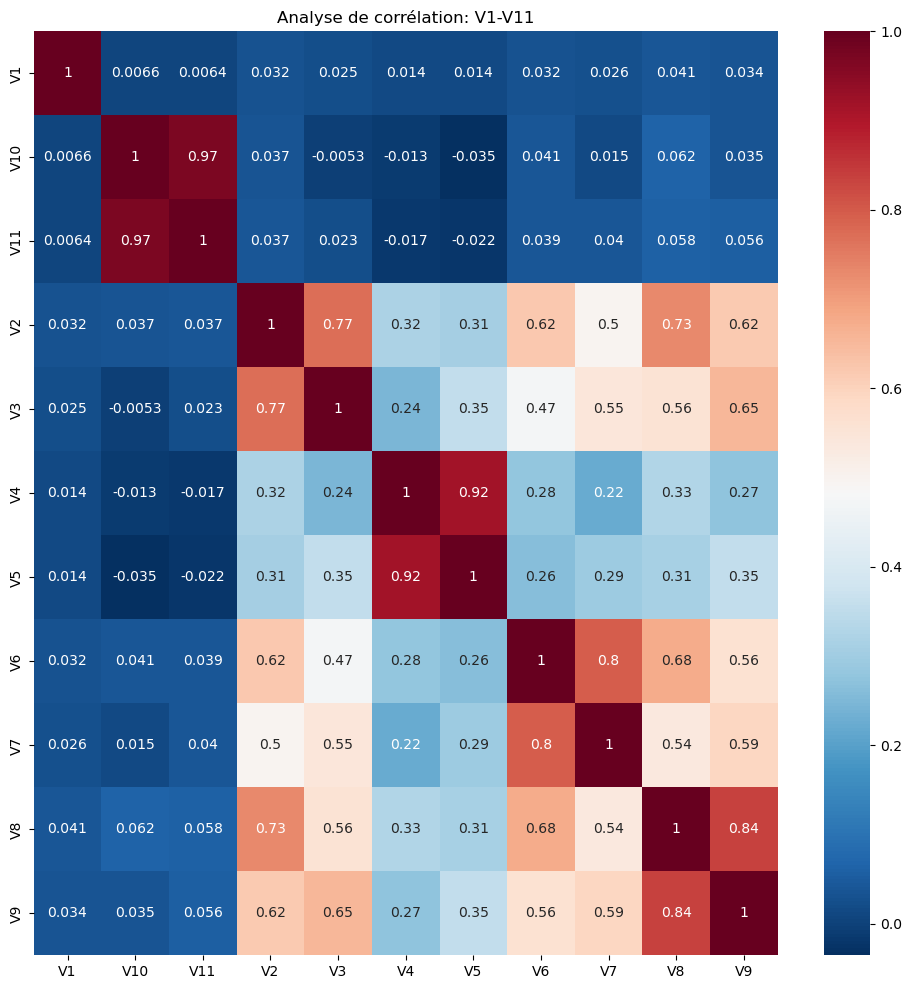

In [302]:
cols = [f"V{i}" for i in range(1, 12)]
correlation_analysis(cols, title="Analyse de corrélation: V1-V11", size=(12,12))

In [303]:
pairs = group_correlated_columns(df_train, cols, threshold=0.75)
cols_reduced_v1_to_v11 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v1_to_v11)
cols_reduced_v1_to_v11

['V1', 'V11', 'V3', 'V4', 'V6', 'V8']

## Groupe2 [V12 - V34]

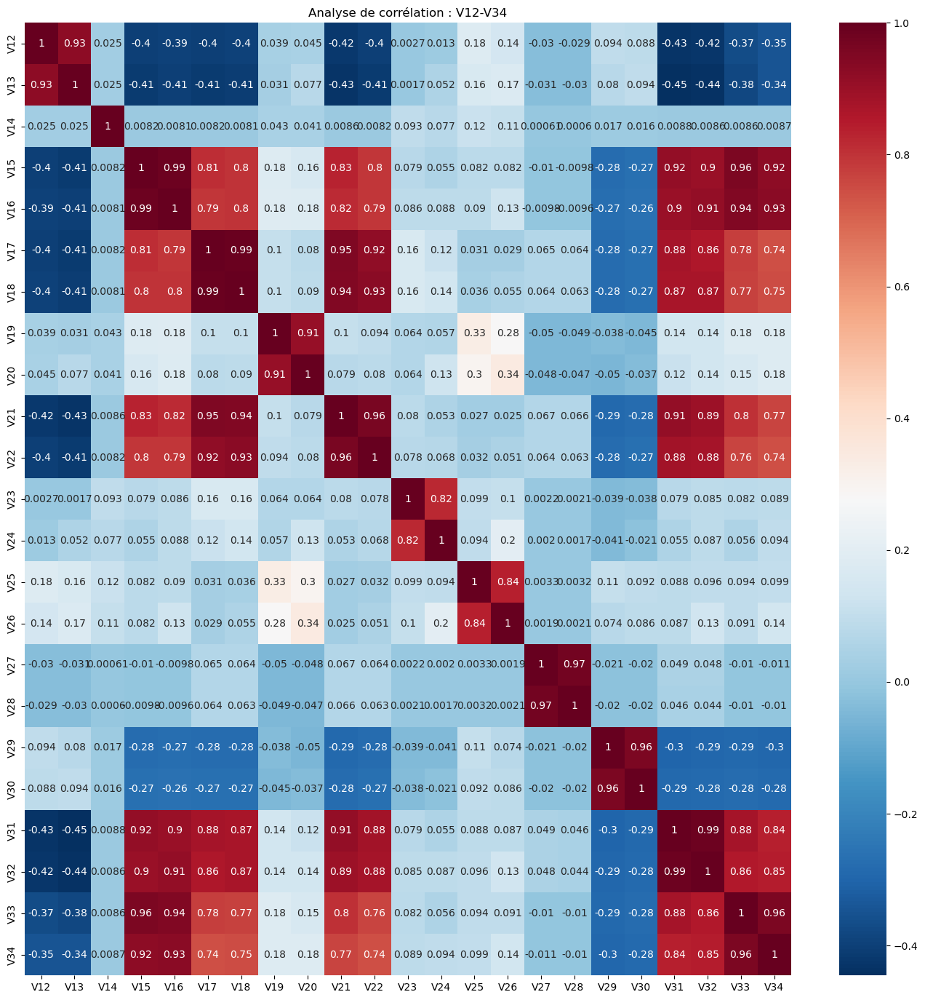

In [304]:
cols = [f"V{i}" for i in range(12, 35)]
correlation_analysis(cols, title="Analyse de corrélation : V12-V34", size=(17,17))

In [305]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v12_to_v34 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v12_to_v34)
cols_reduced_v12_to_v34

['V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30']

## Groupe3 [V35 - V52]

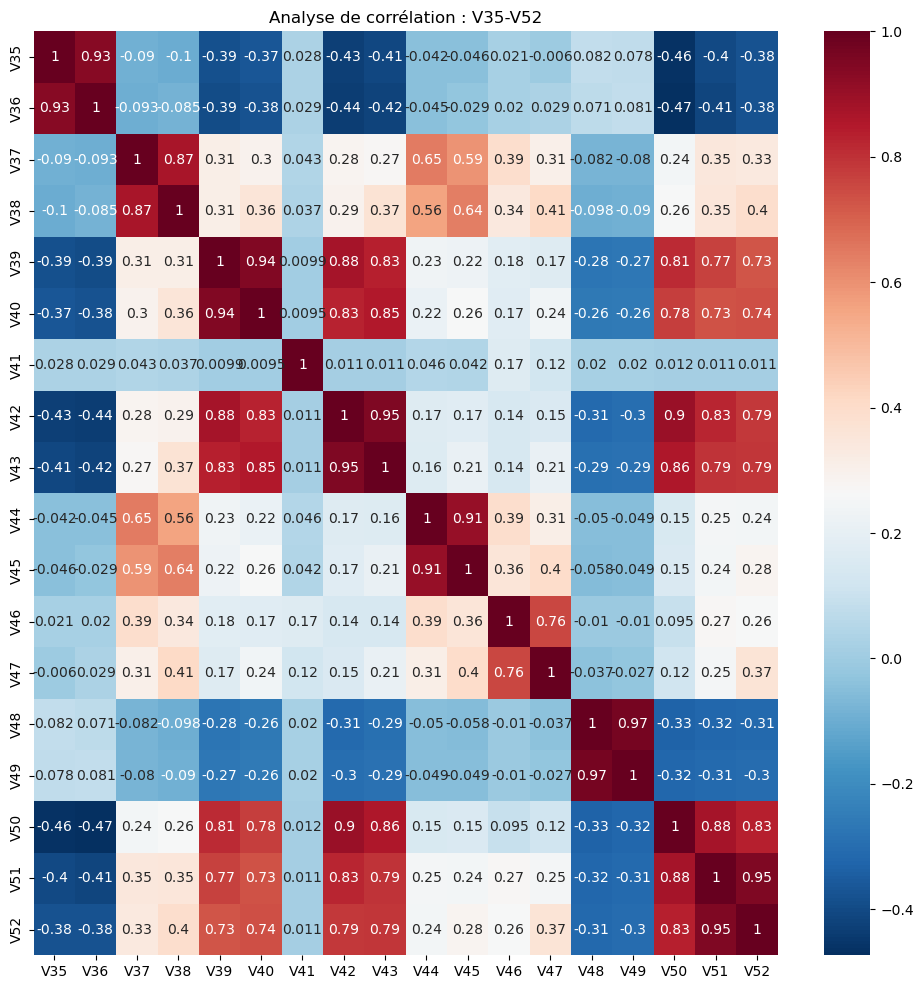

In [306]:
cols = ['V35', 'V40', 'V41', 'V39', 'V38', 'V51', 'V37', 'V52', 'V36', 'V50', 'V48', 'V42',
 'V43', 'V44', 'V46', 'V47', 'V45', 'V49']
correlation_analysis(cols, title="Analyse de corrélation : V35-V52", size=(12,12))

In [307]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v35_to_v52 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v35_to_v52)
cols_reduced_v35_to_v52

['V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48']

## Groupe4 [V52 - V74]

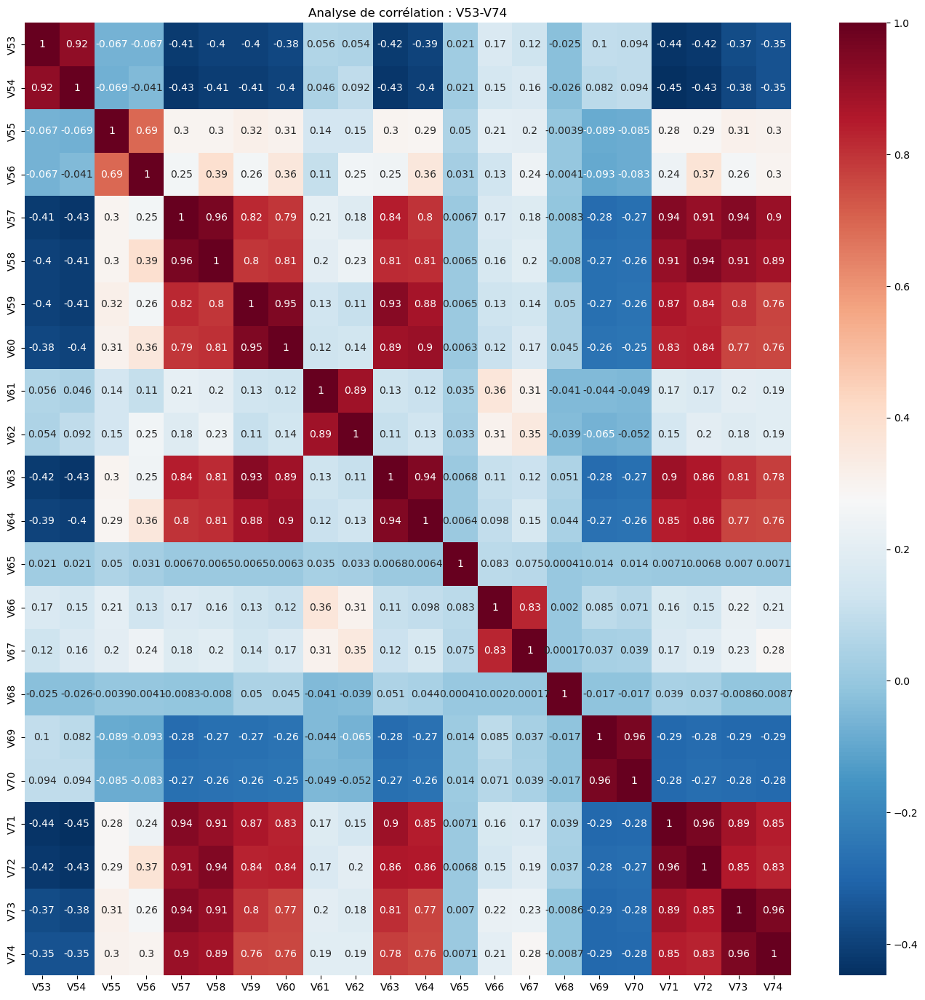

In [308]:
cols = ['V72', 'V74', 'V73', 'V71', 'V65', 'V68', 'V58', 'V70', 'V53', 
 'V54', 'V55', 'V56', 'V57', 'V59', 'V67', 'V60', 'V61',
 'V62', 'V63', 'V64', 'V66', 'V69']
correlation_analysis(cols, title="Analyse de corrélation : V53-V74", size=(17,17))

In [309]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v53_to_v74 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v53_to_v74)
cols_reduced_v53_to_v74

['V54', 'V55', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68', 'V70']

## Groupe5 [V75 - V94]

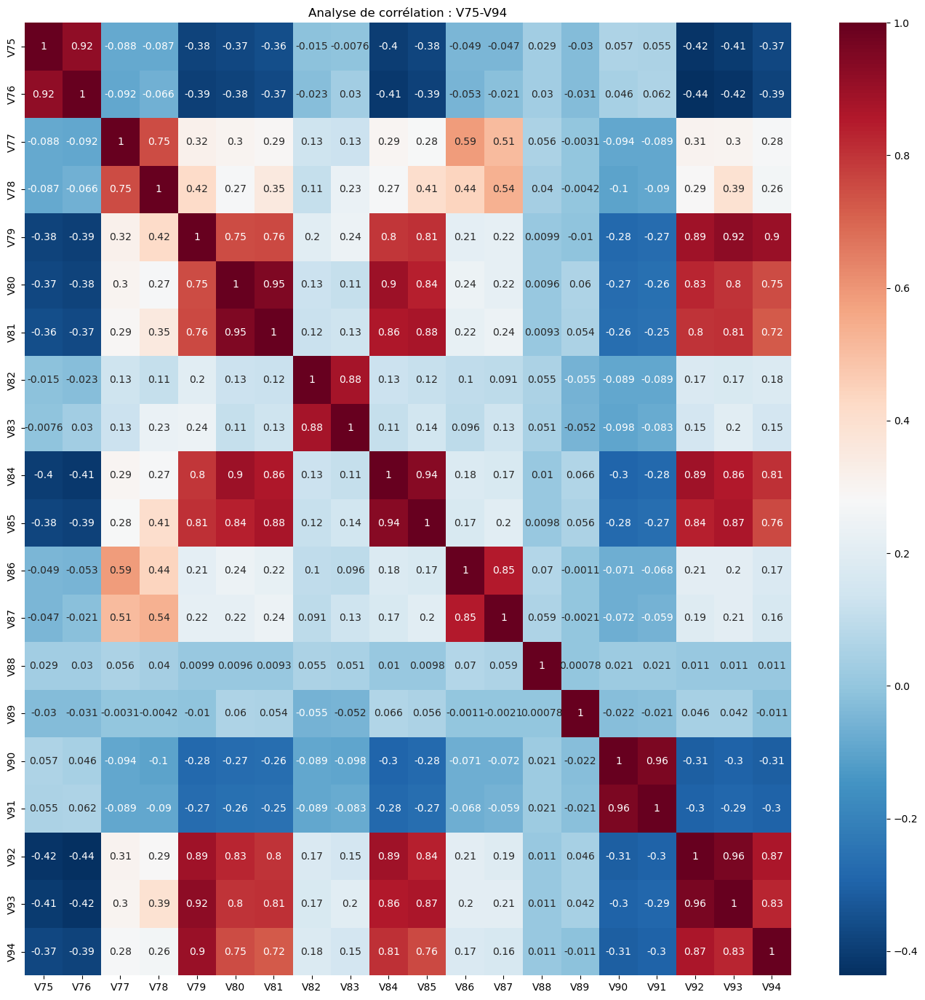

In [310]:
cols = ['V80', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V86', 'V79',
 'V85', 'V75', 'V84', 'V77', 'V83', 'V78', 'V82', 'V81', 'V76']
correlation_analysis(cols, title="Analyse de corrélation : V75-V94", size=(17,17))

In [311]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v75_to_v94 = reduce_groups(df_train, pairs)  
reduced_vcols.extend(cols_reduced_v75_to_v94)
cols_reduced_v75_to_v94

['V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91']

## Groupe6 [V95 - V137]

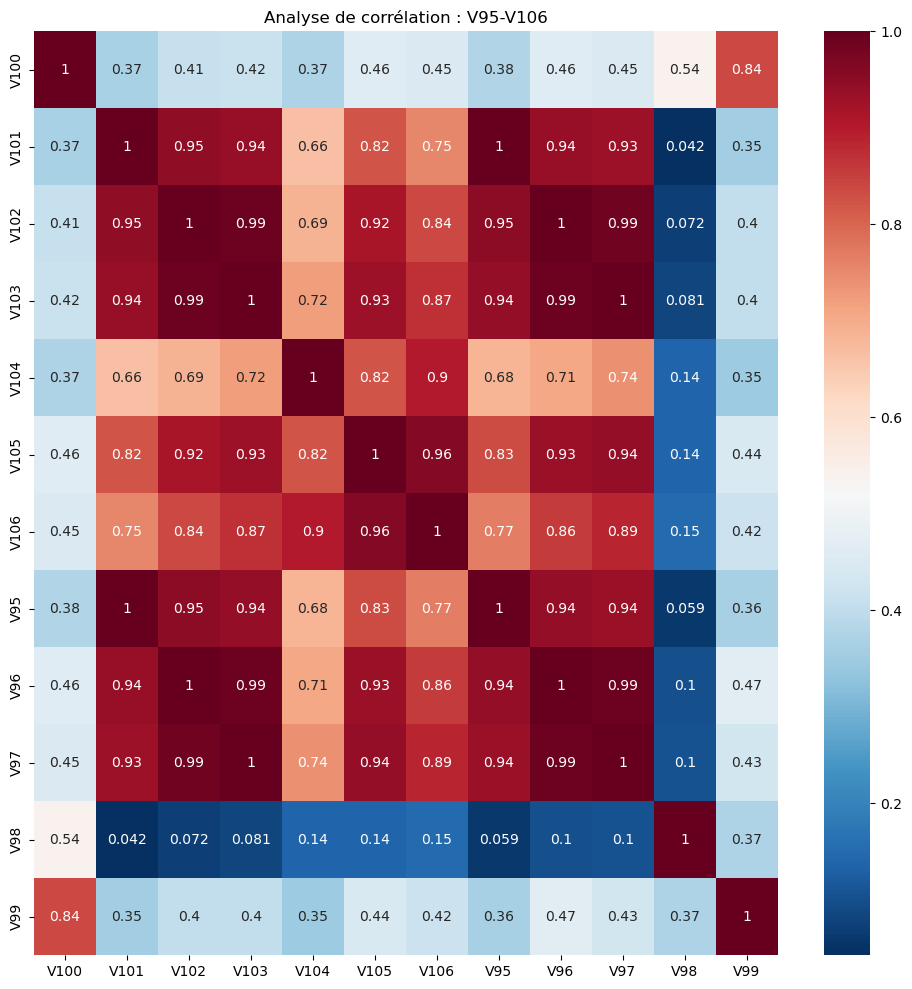

In [312]:
cols = ['V'+str(x) for x in range(95,107)]
correlation_analysis(cols, title="Analyse de corrélation : V95-V106", size=(12,12))

In [313]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v95_to_v107 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v95_to_v107)
cols_reduced_v95_to_v107
# pairs

['V99', 'V96', 'V98']

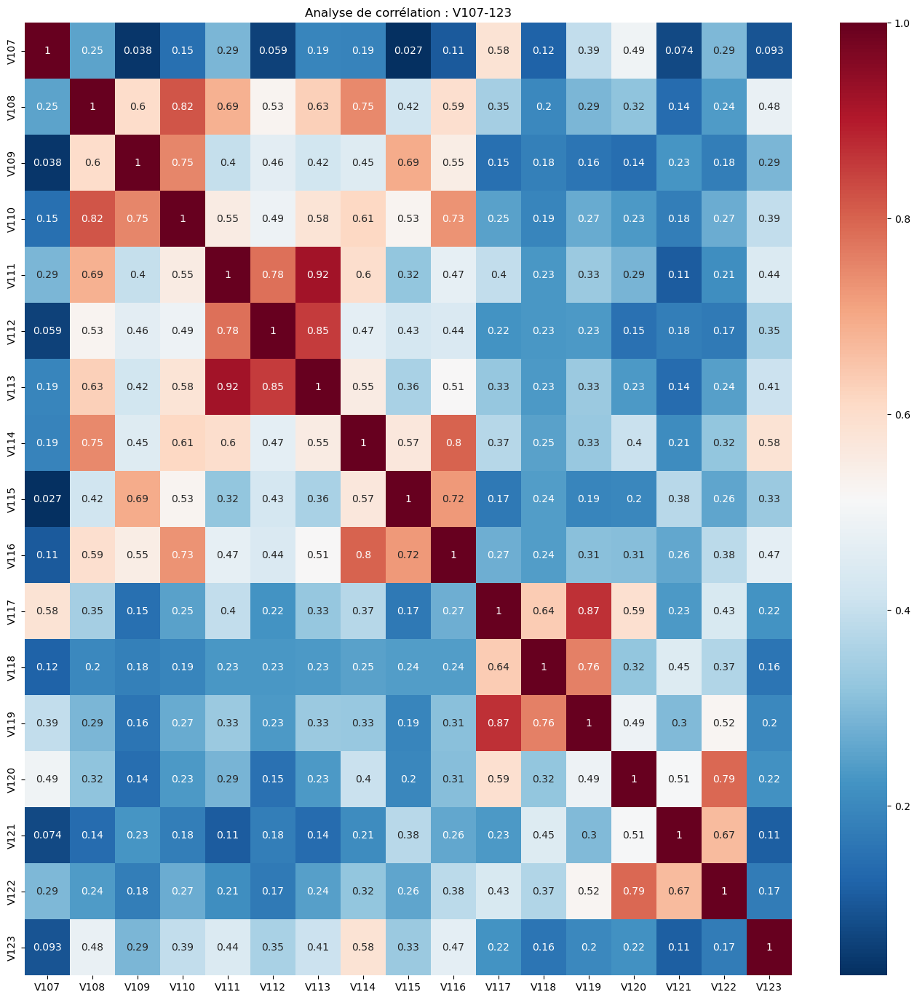

In [314]:
cols = [f"V{i}" for i in range(107, 124)]
correlation_analysis(cols, title="Analyse de corrélation : V107-123", size=(17, 17))

In [315]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v107_to_v123 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v107_to_v123)
cols_reduced_v107_to_v123

['V107',
 'V108',
 'V109',
 'V111',
 'V114',
 'V115',
 'V117',
 'V120',
 'V121',
 'V123']

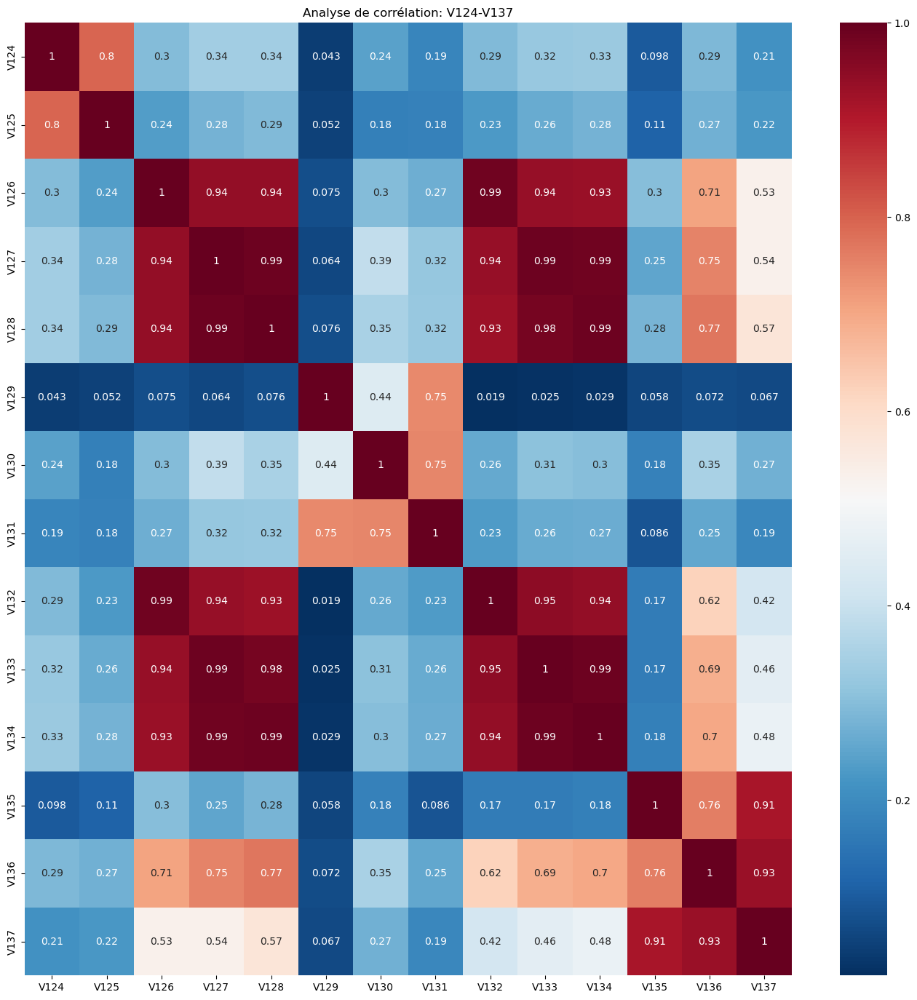

In [316]:
cols = ['V'+str(x) for x in range(124,138)]
coorelation_analysis(cols,title='Analyse de corrélation: V124-V137',size=(17,17))

In [317]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v124_to_v137 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v124_to_v137)
cols_reduced_v124_to_v137

['V124', 'V127', 'V129', 'V130', 'V131']

## Groupe7 [V138 - V163]

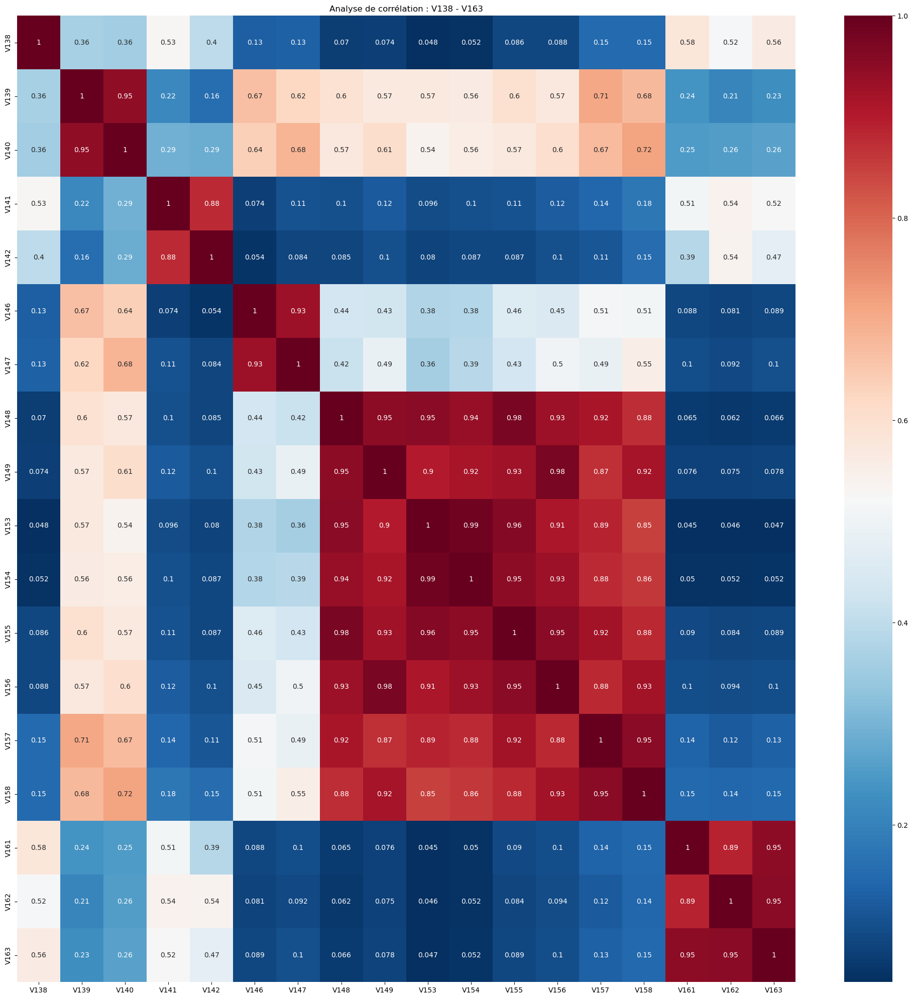

In [318]:
cols = ['V142', 'V158', 'V140', 'V162', 'V141', 'V161', 'V157', 'V146', 'V156', 'V155', 'V154',
        'V153', 'V149', 'V147', 'V148', 'V163', 'V139', 'V138']
coorelation_analysis(cols, title="Analyse de corrélation : V138 - V163", size=(25,25))

In [319]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v138_to_v163 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v138_to_v163)
cols_reduced_v138_to_v163

['V138', 'V139', 'V142', 'V147', 'V155', 'V162']

## Groupe8 [V143 - V166]

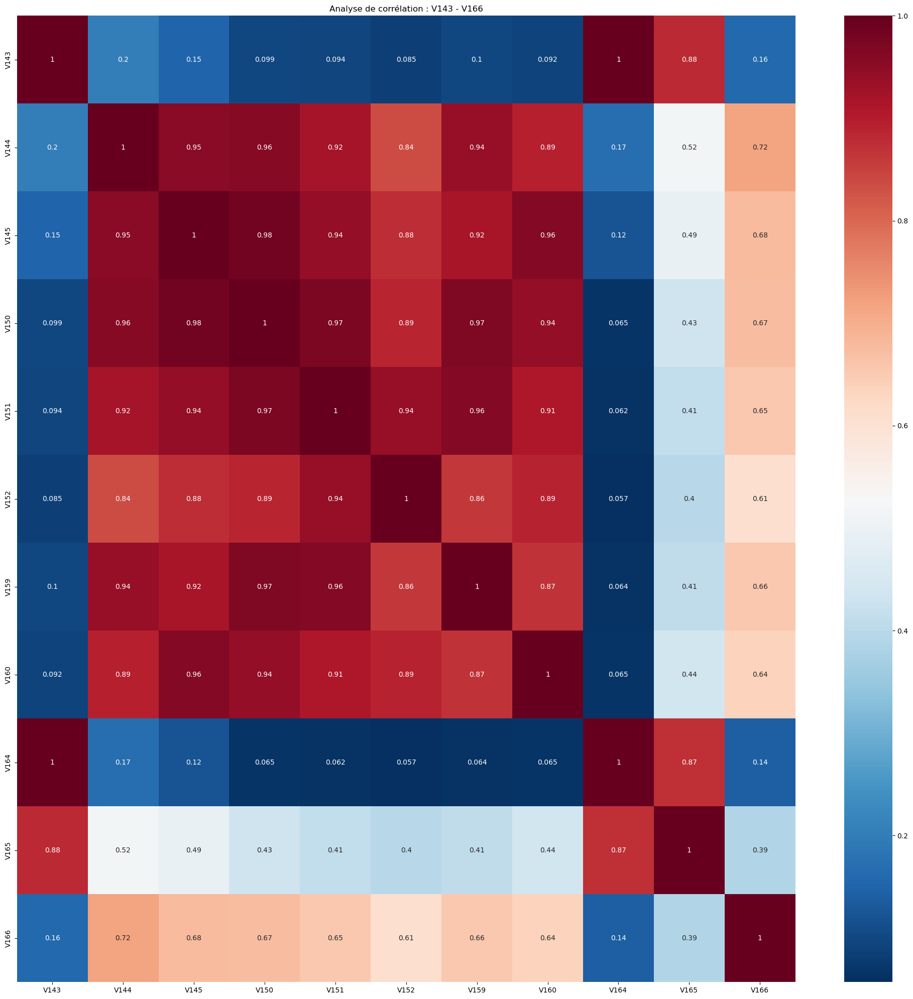

In [320]:
cols = ['V160', 'V151', 'V152', 'V145', 'V144', 'V143', 'V159', 'V164', 'V165', 'V166', 'V150']
correlation_analysis(cols, title="Analyse de corrélation : V143 - V166", size=(25, 25))

In [321]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v143_to_v166 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v143_to_v166)
cols_reduced_v143_to_v166

['V165', 'V160', 'V166']

## Groupe9 [V167 - V216]

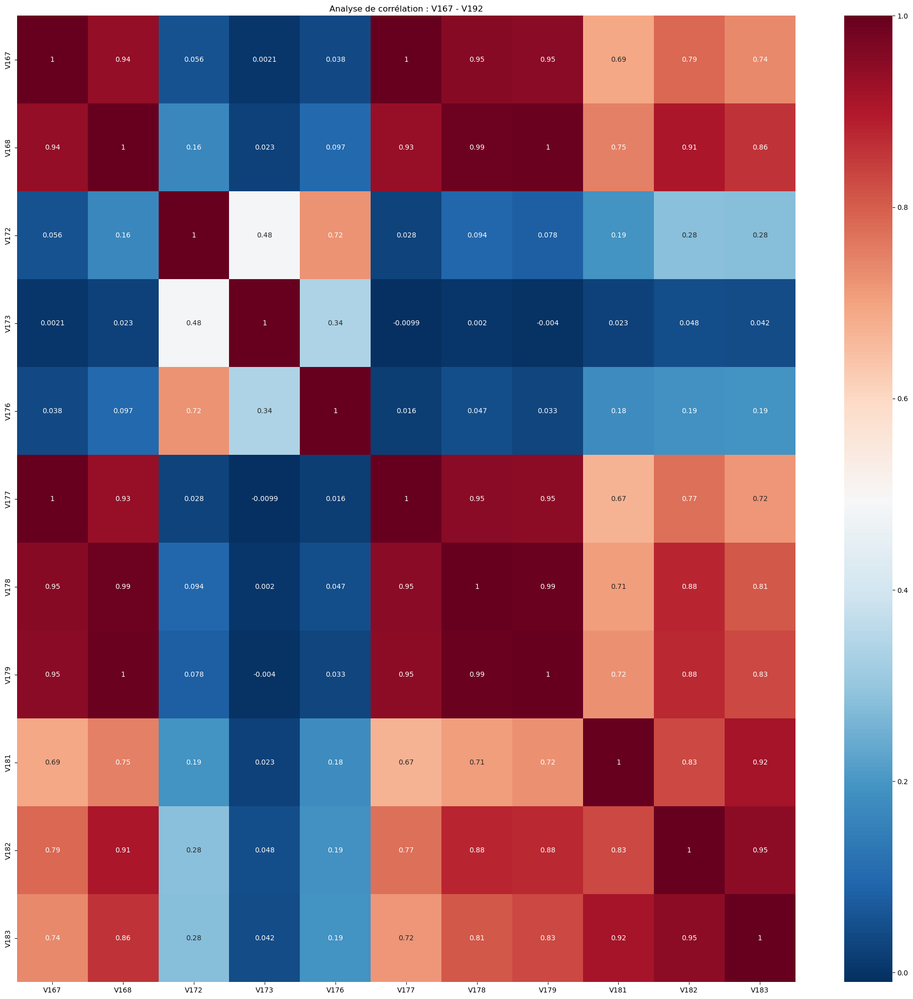

In [322]:
cols = ['V167', 'V168','V172','V173','V176','V177','V178','V179','V181','V182','V183']
coorelation_analysis(cols, title="Analyse de corrélation : V167 - V192", size=(25, 25))

In [323]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v167_to_v192 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v167_to_v192)
cols_reduced_v167_to_v192

['V178', 'V172', 'V173', 'V176']

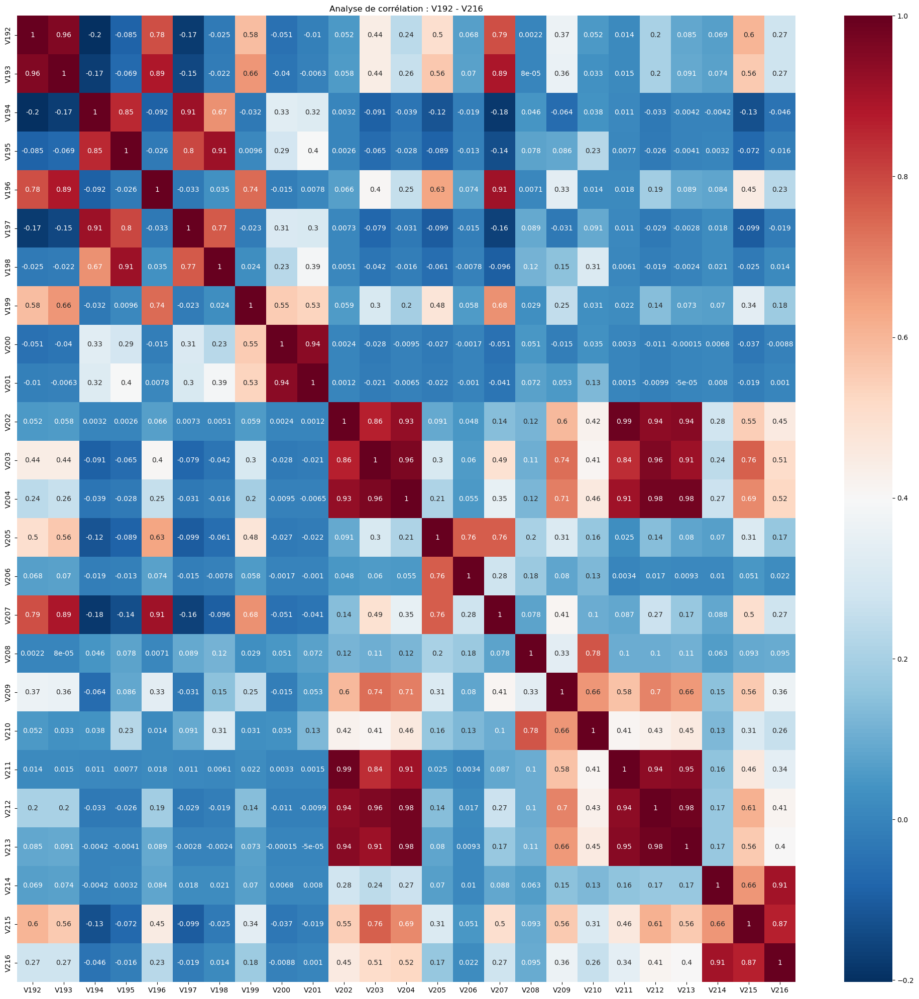

In [324]:
cols = [f"V{i}" for i in range(192, 217)]
correlation_analysis(cols, title="Analyse de corrélation : V192 - V216", size=(25, 25))

In [325]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v192_to_v217 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v192_to_v217)
cols_reduced_v192_to_v217

['V207', 'V198', 'V199', 'V201', 'V203', 'V210', 'V209']

## Groupe10 [V217 - V278]

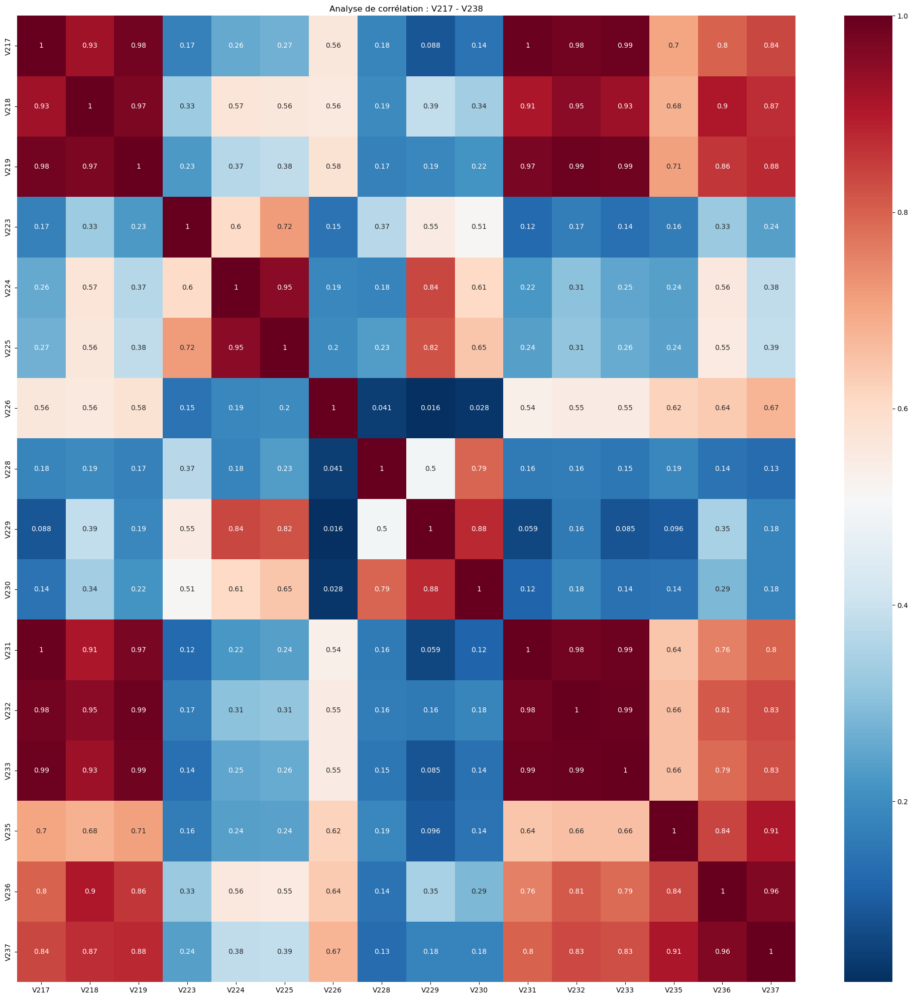

In [326]:
cols = ['V217','V218','V219','V231','V232','V233','V236','V237','V223','V224','V225','V226','V228','V229','V230','V235']
coorelation_analysis(cols,title="Analyse de corrélation : V217 - V238", size=(25, 25))

In [327]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v217_to_v238 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v217_to_v238)
cols_reduced_v217_to_v238

['V218', 'V223', 'V229', 'V226']

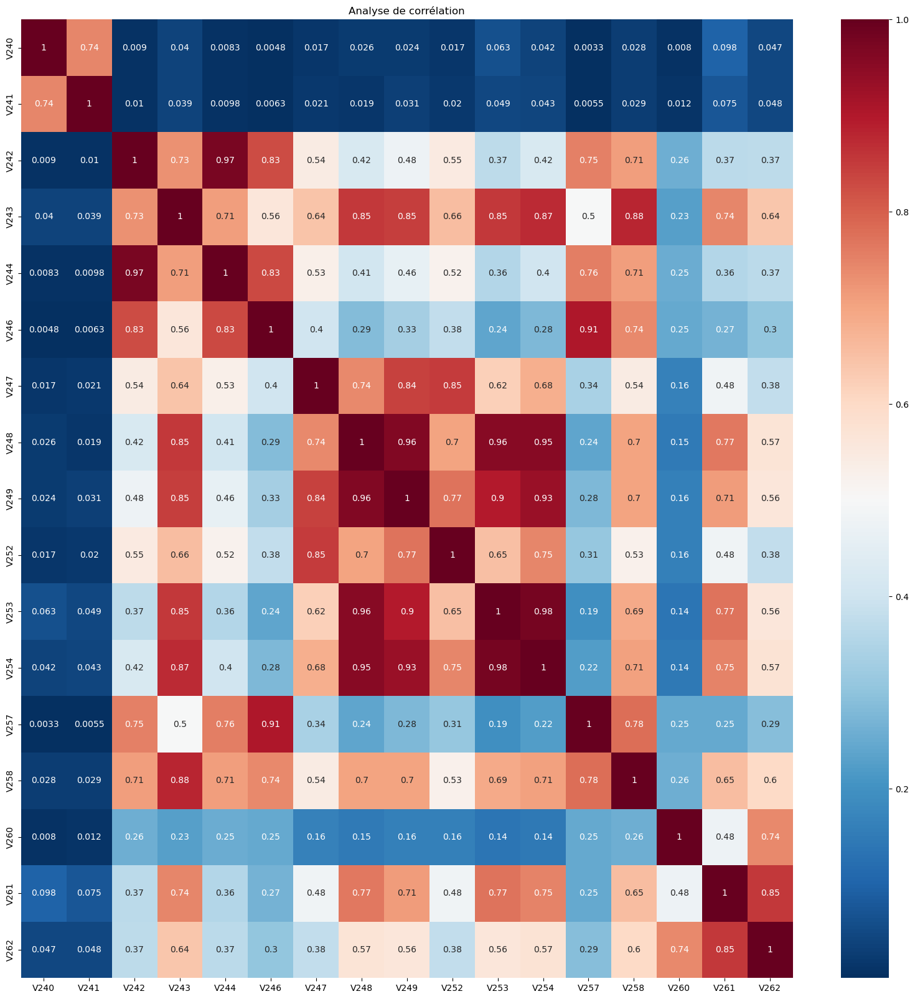

In [328]:
cols = ['V240','V241','V242','V243','V244','V258','V246','V257','V247','V248','V249','V253','V254','V252','V260','V261','V262']

coorelation_analysis(cols,title='Analyse de corrélation',size=(20,20))

In [329]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v238_to_v258 = reduce_groups(df_train,pairs)
reduced_vcols.extend(cols_reduced_v238_to_v258)
cols_reduced_v238_to_v258

['V240', 'V241', 'V258', 'V260']

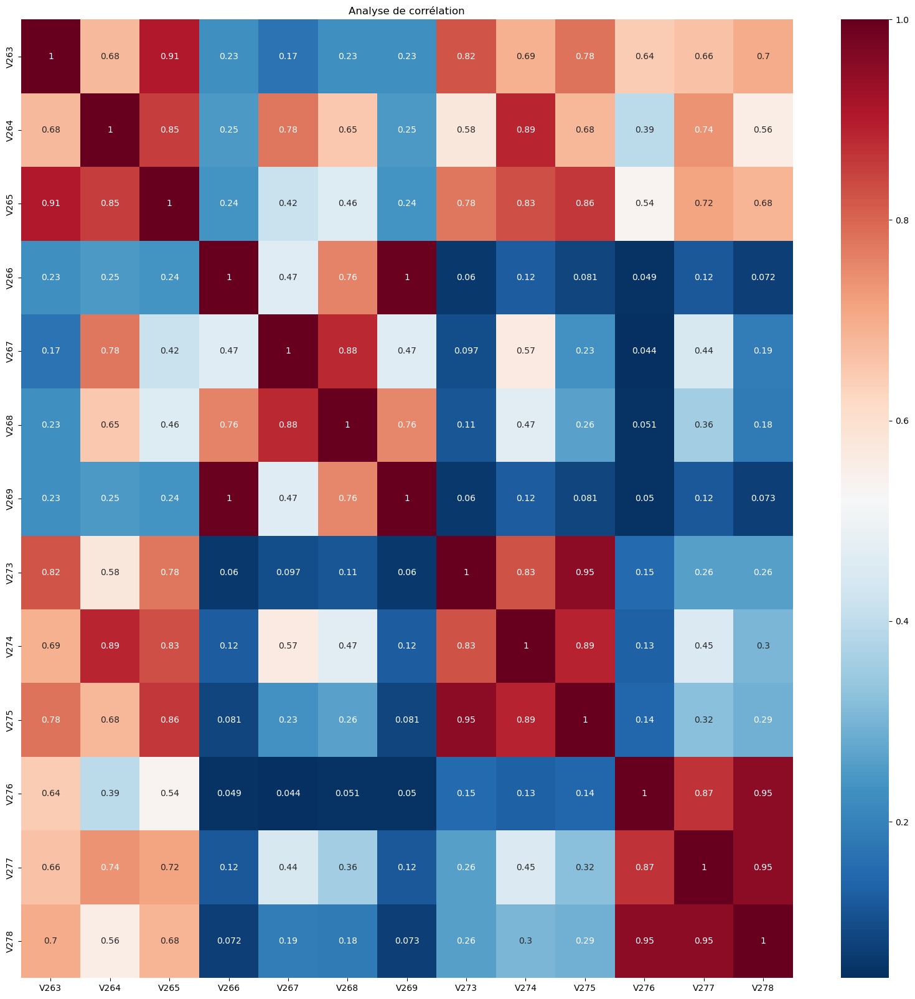

In [330]:
cols =  ['V263','V265','V264','V266','V269','V267','V268','V273','V274','V275','V276','V277','V278']

coorelation_analysis(cols,title='Analyse de corrélation',size=(20,20))

In [331]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v258_to_v278 = reduce_groups(df_train,pairs)
reduced_vcols.extend(cols_reduced_v258_to_v278)
cols_reduced_v258_to_v278

['V264', 'V277']

## Groupe11 [V220 - V272]

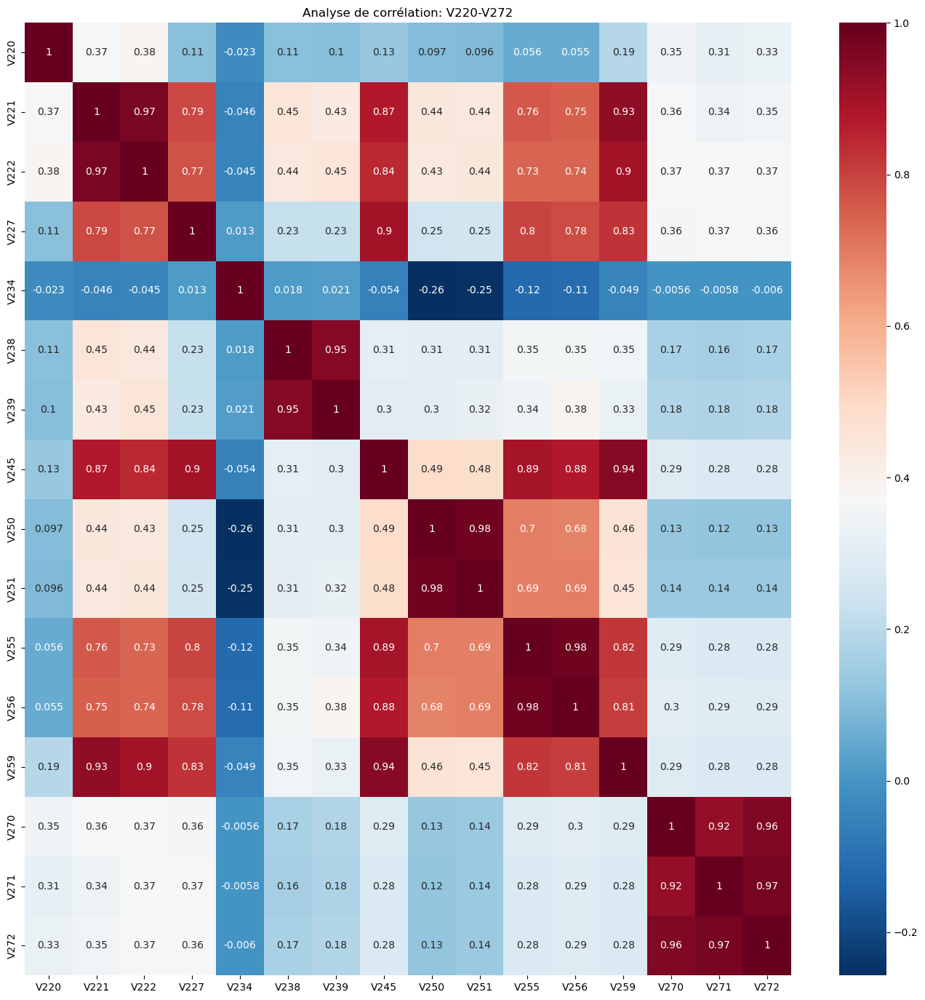

In [332]:
cols = ['V245', 'V271', 'V234', 'V222', 'V238', 'V239', 'V227', 'V250', 
 'V272', 'V270', 'V251', 'V220', 'V255', 'V256', 'V259', 'V221']

coorelation_analysis(cols,title='Analyse de corrélation: V220-V272',size=(17,17))


In [333]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v279_to_v300 = reduce_groups(df_train,pairs)
reduced_vcols.extend(cols_reduced_v279_to_v300)
cols_reduced_v279_to_v300

['V220', 'V221', 'V234', 'V238', 'V250', 'V271']

## Groupe12 [V279 - V321]

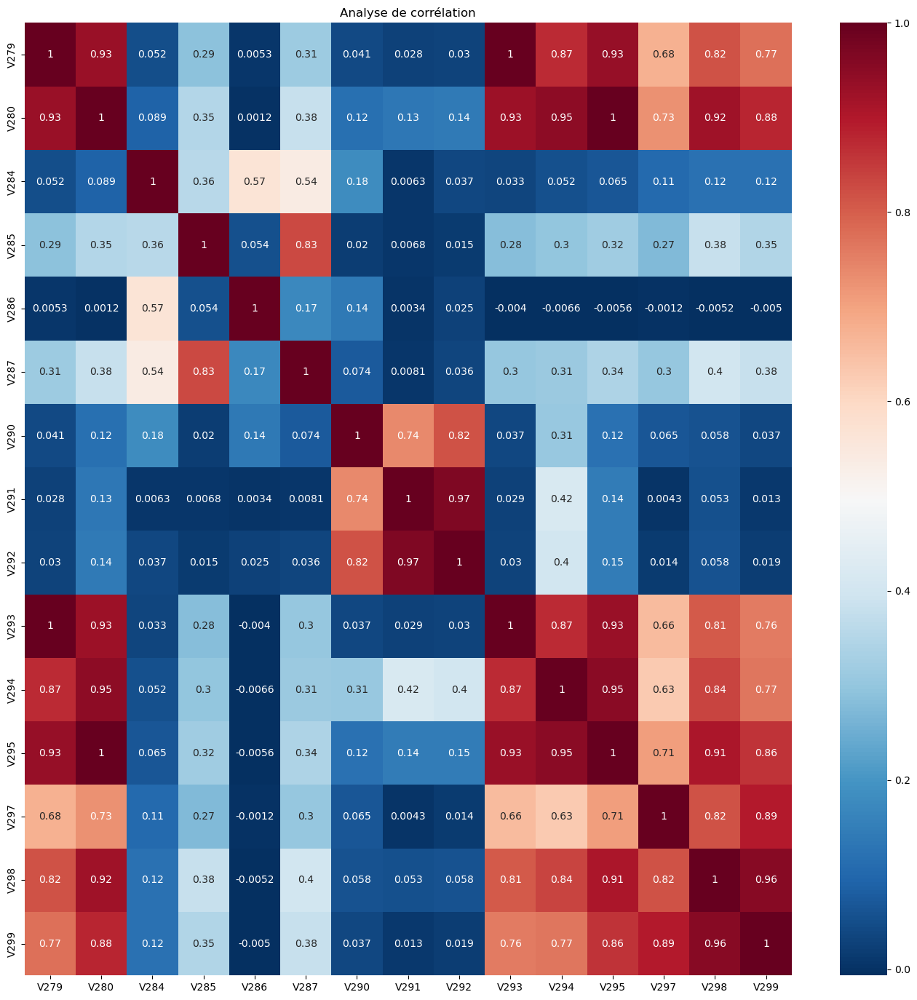

In [334]:
cols = ['V279','V280','V293','V294','V295','V298','V299','V284','V285','V287','V286','V290','V291','V292','V297']

coorelation_analysis(cols,title='Analyse de corrélation',size=(17,17))

In [335]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v279_to_v299 = reduce_groups(df_train,pairs)
reduced_vcols.extend(cols_reduced_v279_to_v299)
cols_reduced_v279_to_v299

['V294', 'V284', 'V285', 'V286', 'V291']

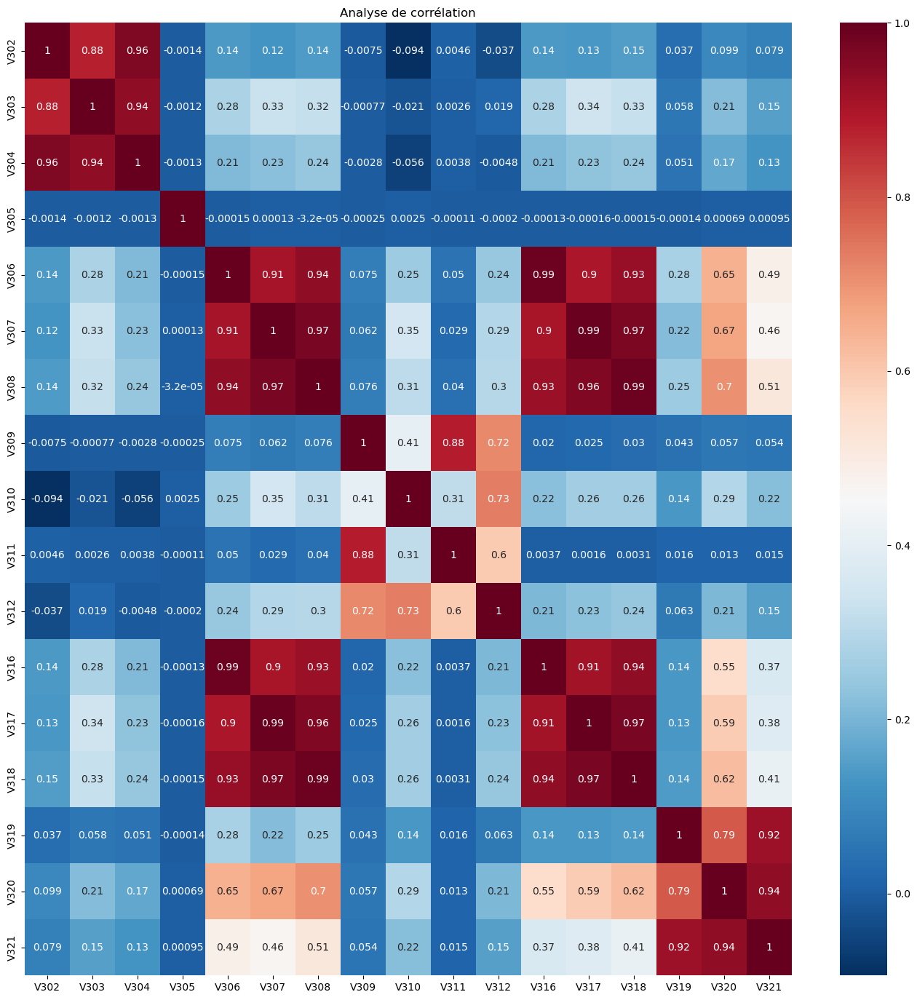

In [336]:
cols = ['V302','V303','V304','V305','V306','V307','V308','V316','V317','V318','V309','V311','V310','V312','V319','V320','V321']

correlation_analysis(cols,title='Analyse de corrélation',size=(17,17))

In [337]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v300_to_v321 = reduce_groups(df_train,pairs)
reduced_vcols.extend(cols_reduced_v300_to_v321)
cols_reduced_v300_to_v321

['V303', 'V305', 'V307', 'V309', 'V310', 'V312', 'V320']

## Groupe13 [V281 - V313]

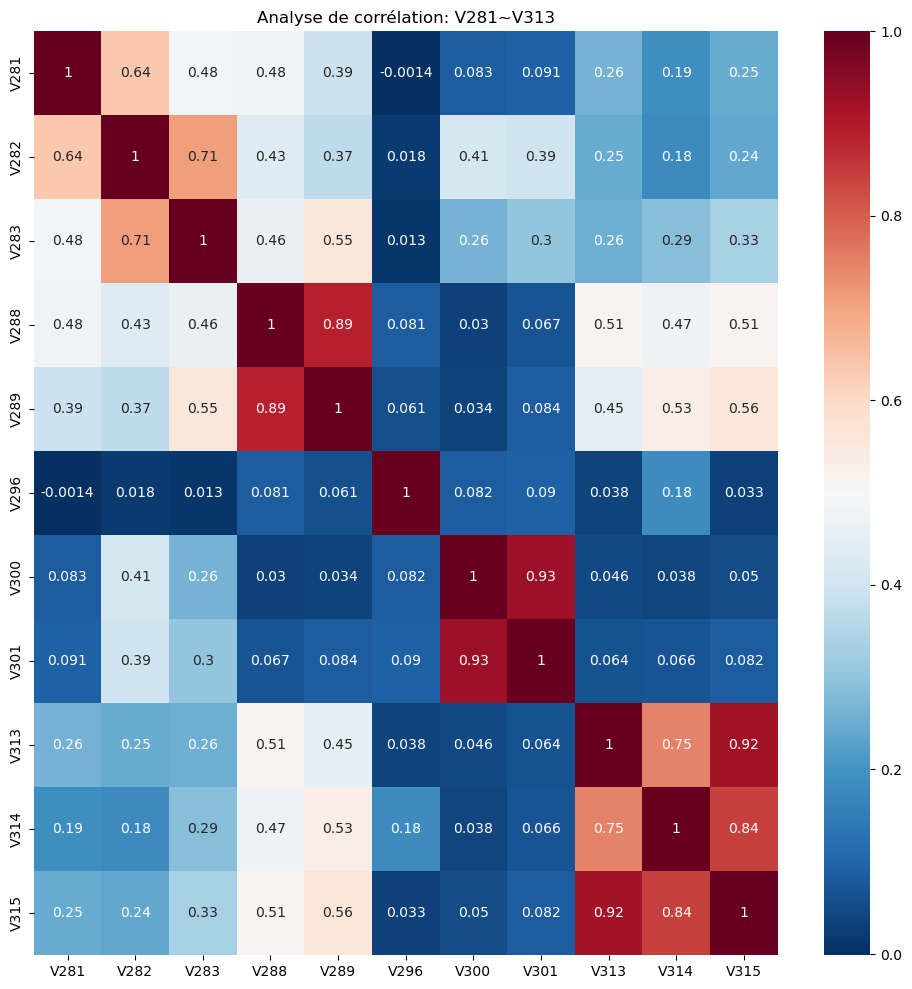

In [338]:
cols = ['V296', 'V289', 'V288', 'V283', 'V282', 'V281', 'V300', 'V301', 'V313', 'V314', 'V315']

correlation_analysis(cols,title='Analyse de corrélation: V281~V313',size=(12,12))


In [339]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v281_to_v313 = reduce_groups(df_train,pairs)
reduced_vcols.extend(cols_reduced_v281_to_v313)
cols_reduced_v281_to_v313

['V281', 'V282', 'V283', 'V289', 'V296', 'V301', 'V314']

## Groupe14 [V322 - V339]

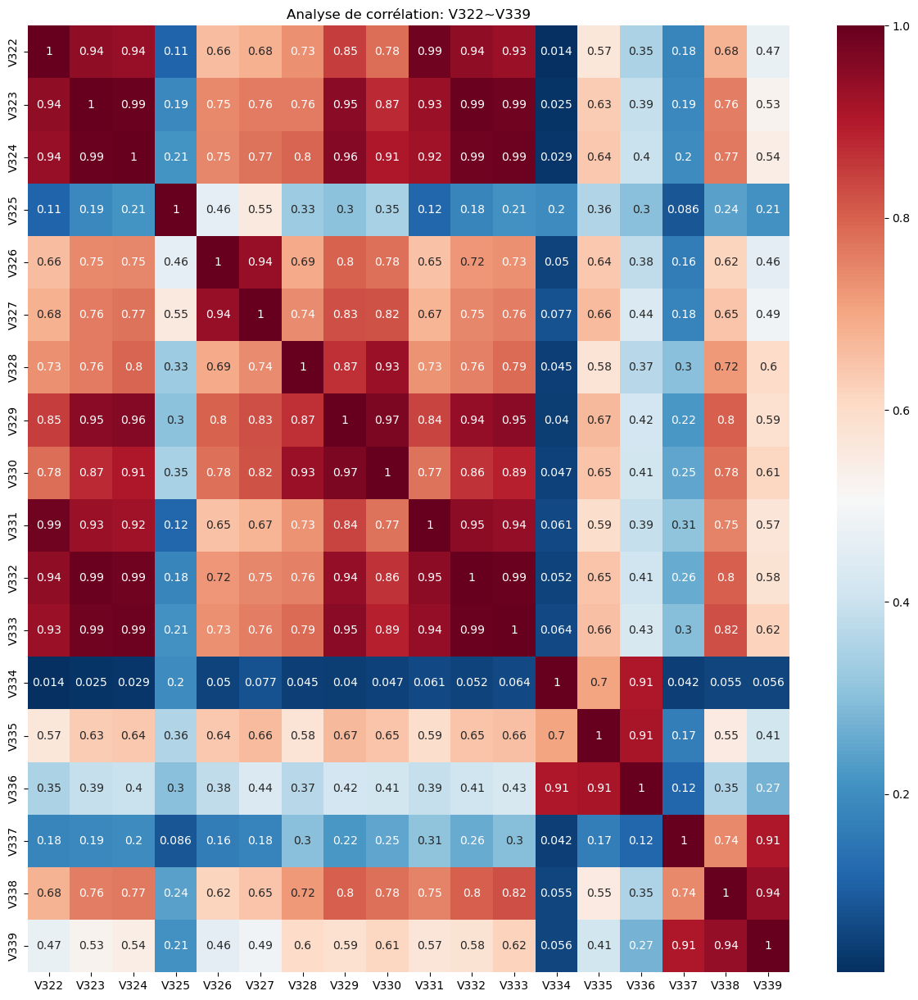

In [340]:
cols = ['V337', 'V333', 'V336', 'V335', 'V334', 'V338', 'V339', 'V324',
 'V332', 'V325', 'V330', 'V329', 'V328', 'V327', 'V326', 'V322', 'V323', 'V331']

correlation_analysis(cols,title='Analyse de corrélation: V322~V339',size=(15,15))


In [341]:
pairs = group_correlated_columns(df_train, cols)
cols_reduced_v322_to_v339 = reduce_groups(df_train, pairs)
reduced_vcols.extend(cols_reduced_v322_to_v339)
cols_reduced_v322_to_v339

['V332', 'V325', 'V335']

In [342]:
print(reduced_vcols)

['V1', 'V11', 'V3', 'V4', 'V6', 'V8', 'V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30', 'V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48', 'V54', 'V55', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91', 'V99', 'V96', 'V98', 'V107', 'V108', 'V109', 'V111', 'V114', 'V115', 'V117', 'V120', 'V121', 'V123', 'V124', 'V127', 'V129', 'V130', 'V131', 'V138', 'V139', 'V142', 'V147', 'V155', 'V162', 'V165', 'V160', 'V166', 'V178', 'V172', 'V173', 'V176', 'V207', 'V198', 'V199', 'V201', 'V203', 'V210', 'V209', 'V218', 'V223', 'V229', 'V226', 'V240', 'V241', 'V258', 'V260', 'V264', 'V277', 'V220', 'V221', 'V234', 'V238', 'V250', 'V271', 'V294', 'V284', 'V285', 'V286', 'V291', 'V303', 'V305', 'V307', 'V309', 'V310', 'V312', 'V320', 'V281', 'V282', 'V283', 'V289', 'V296', 'V301', 'V314', 'V332', 'V325', 'V335']


In [343]:
reduced_vcols = list(set(reduced_vcols))
len(reduced_vcols)

114

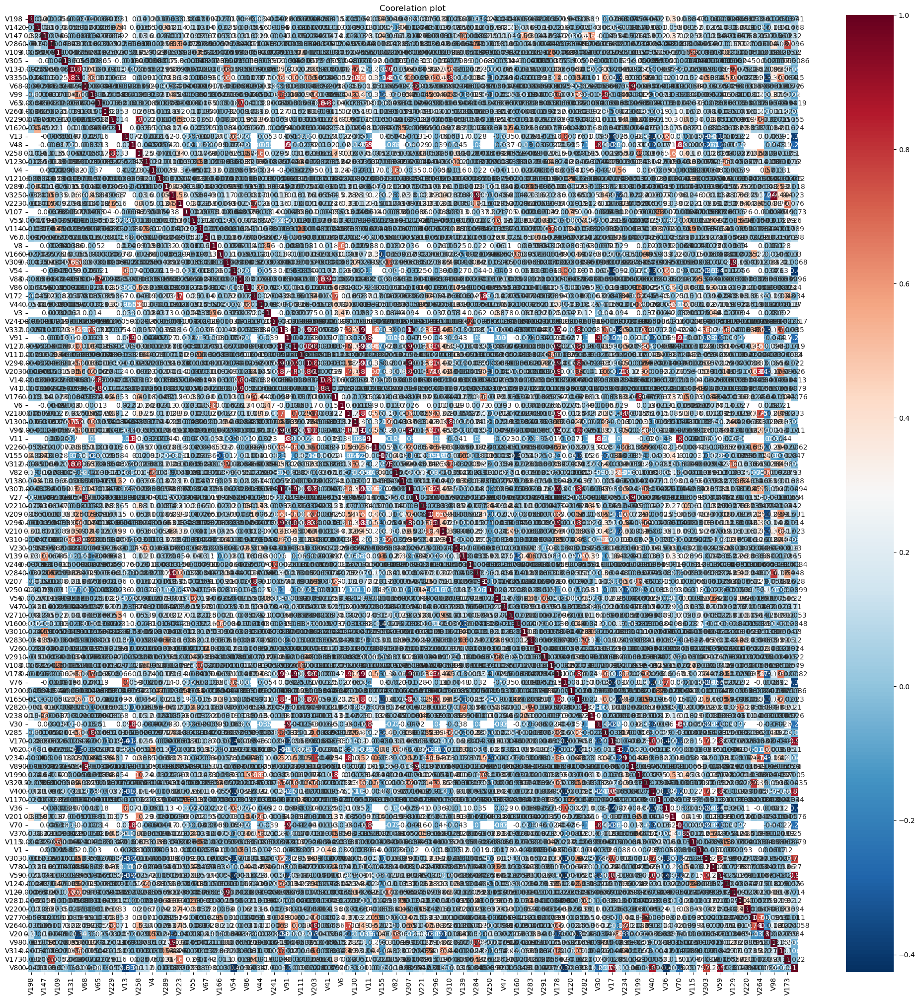

In [344]:
fig,axes = plt.subplots(1,1,figsize=(25,25))
df_corr = df_train[reduced_vcols].corr()
sns.heatmap(df_corr,annot=True,cmap='RdBu_r')
axes.title.set_text('Coorelation plot')
plt.show()

* Nous constatons qu'une forte corrélation subsiste pour quelques éléments. Cependant, elle est limitée. Nous avons néanmoins réduit le nombre de colonnes V à plus de 50 %. Examinons l'état des autres colonnes.

## Analyse de corrélation sur les colonnes M

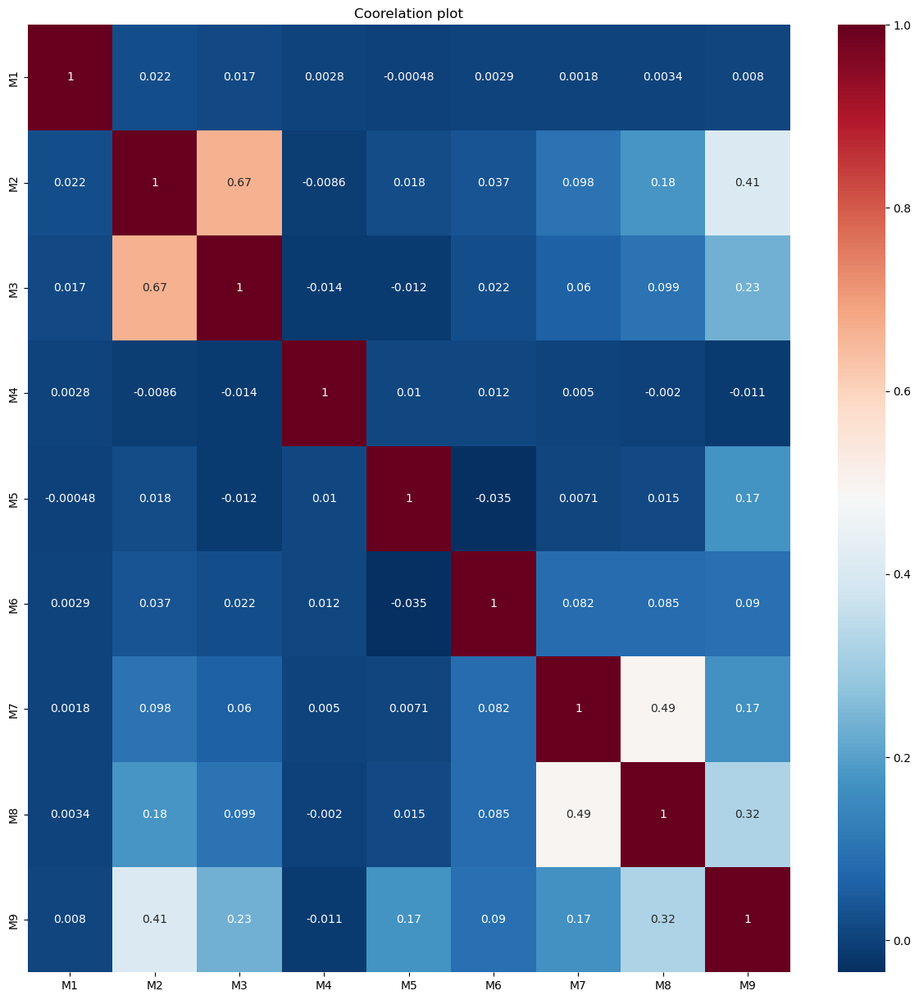

In [345]:
m_cols = [col for col in df_train.columns if col[0] == 'M']

mp = {'F':0,'T':1,'M0':0,'M1':1,'M2':2}
for c in m_cols: df_train[c] = df_train[c].map(mp)

fig,axes = plt.subplots(1,1,figsize=(15,15))
df_corr = df_train[m_cols].corr()
sns.heatmap(df_corr,annot=True,cmap='RdBu_r')
axes.title.set_text('Coorelation plot')
plt.show()

## Modèle avec colonnes en V réduites

In [346]:
# column details
cat_cols = (['ProductCD'] + 
            ['card%d' % i for i in range(1, 7)] + 
            ['addr1', 'addr2', 'P_emaildomain', 'R_emaildomain'] + 
            ['M%d' % i for i in range(1, 10)] + 
            ['DeviceType', 'DeviceInfo'] +
            ['id_%d' % i for i in range(12, 39)])


type_map = {c: str for c in cat_cols}
df_train[cat_cols] = df_train[cat_cols].astype(type_map, copy=False)

######################################################################################

id_cols = ['TransactionID', 'TransactionDT']
target = 'isFraud'

numeric_cols =  [
    'TransactionAmt', 'dist1', 'dist2', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 
    'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 
    'D12', 'D13', 'D14', 'D15', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 
    'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 
    'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 
    'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 
    'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 
    'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 
    'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 
    'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 
    'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 
    'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 
    'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 
    'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 
    'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 
    'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 
    'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 
    'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200', 'V201', 'V202', 'V203', 'V204', 
    'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 
    'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 
    'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240', 
    'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250', 'V251', 'V252', 
    'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264', 
    'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 
    'V277', 'V278', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 
    'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300', 
    'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 
    'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321', 'V322', 'V323', 'V324', 
    'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 
    'V337', 'V338', 'V339', 'id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08', 
    'id_09', 'id_10', 'id_11'
]



In [347]:
# droping v cols 
drop_cols = [col for col in df_train.columns if col[0] == 'V' and col not in reduced_vcols]

print(f'dropping {len(drop_cols)} columns')
df_train = df_train.drop(columns=drop_cols)

dropping 225 columns


In [349]:
df_train.to_csv('../Data/train_reduced.csv', index=False)

In [351]:
import gc
gc.collect()

640

In [357]:
df_train[df_train.isnull() == True]

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590536,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590537,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590538,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [362]:
top_missing_cols(df_train, n=None, thresh=0)

Il y a 142 colonnes dans ce jeu de données contenant des valeurs manquantes.
Il y a 142 colonnes dont le pourcentage de valeurs manquantes est supérieur à 0%.


,col,missing_percent
0,id_08,99.127070
1,id_07,99.127070
2,dist2,93.628374
3,D7,93.409930
4,D13,89.509263
...,...,...
204,id_36,0.000000
205,id_37,0.000000
206,id_38,0.000000
207,DeviceType,0.000000
